# Detect football players Value in transfer market

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
sns.set(rc={'figure.figsize': [7, 7]}, font_scale=1.2)

In [2]:
df=pd.read_csv('PlayersData.csv',header=0,encoding='unicode_escape')
df.head()

,Age,Potential,Wage,Preferred Foot,Weak Foot,Position,Height,Weight,Crossing,Finishing,...,ShotPower,Jumping,Stamina,Strength,Positioning,Vision,Penalties,GKPositioning,GKReflexes,Value
0,31,94,565K,Left,4,RF,5'7,159lbs,84,95,...,85,68,72,59,94,94,75,14,8,110.5M
1,33,94,405K,Right,4,ST,6'2,183lbs,84,94,...,95,95,88,79,95,82,85,14,11,77M
2,26,93,290K,Right,5,LW,5'9,150lbs,79,87,...,80,61,81,49,89,87,81,15,11,118.5M
3,27,93,260K,Right,3,GK,6'4,168lbs,17,13,...,31,67,43,64,12,68,40,88,94,72M
4,27,92,355K,Right,5,RCM,5'11,154lbs,93,82,...,91,63,90,75,87,94,79,10,13,102M


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1072 entries, 0 to 1071
Data columns (total 31 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Age              1072 non-null   int64 
 1   Potential        1072 non-null   int64 
 2   Wage             1072 non-null   object
 3   Preferred Foot   1072 non-null   object
 4   Weak Foot        1072 non-null   int64 
 5   Position         1072 non-null   object
 6   Height           1072 non-null   object
 7   Weight           1072 non-null   object
 8   Crossing         1072 non-null   int64 
 9   Finishing        1072 non-null   int64 
 10  HeadingAccuracy  1072 non-null   int64 
 11  ShortPassing     1072 non-null   int64 
 12  Volleys          1072 non-null   int64 
 13  Dribbling        1072 non-null   int64 
 14  Curve            1072 non-null   int64 
 15  BallControl      1072 non-null   int64 
 16  Acceleration     1072 non-null   int64 
 17  SprintSpeed      1072 non-null   

In [4]:
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1072 entries, 0 to 1071
Data columns (total 31 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Age              1072 non-null   int64 
 1   Potential        1072 non-null   int64 
 2   Wage             1072 non-null   object
 3   Preferred Foot   1072 non-null   object
 4   Weak Foot        1072 non-null   int64 
 5   Position         1072 non-null   object
 6   Height           1072 non-null   object
 7   Weight           1072 non-null   object
 8   Crossing         1072 non-null   int64 
 9   Finishing        1072 non-null   int64 
 10  HeadingAccuracy  1072 non-null   int64 
 11  ShortPassing     1072 non-null   int64 
 12  Volleys          1072 non-null   int64 
 13  Dribbling        1072 non-null   int64 
 14  Curve            1072 non-null   int64 
 15  BallControl      1072 non-null   int64 
 16  Acceleration     1072 non-null   int64 
 17  SprintSpeed      1072 non-null   

In [5]:
df['Position'].value_counts()

GK     115
ST      97
CB      74
CAM     68
CM      67
LM      64
RM      61
RCB     56
CDM     56
RB      55
LB      51
LCB     48
LCM     38
RCM     38
LS      33
RW      31
RS      28
LW      24
LDM     20
RDM     17
RWB      7
LWB      6
CF       6
RF       4
LF       4
RAM      2
LAM      2
Name: Position, dtype: int64

In [6]:
df.drop(df[df['Position']=='GK'].index,inplace=True)

In [7]:
df['Position'].value_counts()

ST     97
CB     74
CAM    68
CM     67
LM     64
RM     61
CDM    56
RCB    56
RB     55
LB     51
LCB    48
RCM    38
LCM    38
LS     33
RW     31
RS     28
LW     24
LDM    20
RDM    17
RWB     7
CF      6
LWB     6
LF      4
RF      4
LAM     2
RAM     2
Name: Position, dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 31 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Age              957 non-null    int64 
 1   Potential        957 non-null    int64 
 2   Wage             957 non-null    object
 3   Preferred Foot   957 non-null    object
 4   Weak Foot        957 non-null    int64 
 5   Position         957 non-null    object
 6   Height           957 non-null    object
 7   Weight           957 non-null    object
 8   Crossing         957 non-null    int64 
 9   Finishing        957 non-null    int64 
 10  HeadingAccuracy  957 non-null    int64 
 11  ShortPassing     957 non-null    int64 
 12  Volleys          957 non-null    int64 
 13  Dribbling        957 non-null    int64 
 14  Curve            957 non-null    int64 
 15  BallControl      957 non-null    int64 
 16  Acceleration     957 non-null    int64 
 17  SprintSpeed      957 non-null    i

In [9]:
def RemoveDollarSign(Value):
    return Value[1:-1]

In [10]:
df['Value']=df['Value'].apply(RemoveDollarSign)

In [11]:
df.head()

,Age,Potential,Wage,Preferred Foot,Weak Foot,Position,Height,Weight,Crossing,Finishing,...,ShotPower,Jumping,Stamina,Strength,Positioning,Vision,Penalties,GKPositioning,GKReflexes,Value
0,31,94,565K,Left,4,RF,5'7,159lbs,84,95,...,85,68,72,59,94,94,75,14,8,110.5
1,33,94,405K,Right,4,ST,6'2,183lbs,84,94,...,95,95,88,79,95,82,85,14,11,77
2,26,93,290K,Right,5,LW,5'9,150lbs,79,87,...,80,61,81,49,89,87,81,15,11,118.5
4,27,92,355K,Right,5,RCM,5'11,154lbs,93,82,...,91,63,90,75,87,94,79,10,13,102
5,27,91,340K,Right,4,LF,5'8,163lbs,81,84,...,82,56,83,66,87,89,86,8,8,93


In [12]:
df['Value']=pd.to_numeric(df['Value'],errors='coerce')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 31 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              957 non-null    int64  
 1   Potential        957 non-null    int64  
 2   Wage             957 non-null    object 
 3   Preferred Foot   957 non-null    object 
 4   Weak Foot        957 non-null    int64  
 5   Position         957 non-null    object 
 6   Height           957 non-null    object 
 7   Weight           957 non-null    object 
 8   Crossing         957 non-null    int64  
 9   Finishing        957 non-null    int64  
 10  HeadingAccuracy  957 non-null    int64  
 11  ShortPassing     957 non-null    int64  
 12  Volleys          957 non-null    int64  
 13  Dribbling        957 non-null    int64  
 14  Curve            957 non-null    int64  
 15  BallControl      957 non-null    int64  
 16  Acceleration     957 non-null    int64  
 17  SprintSpeed    

In [14]:
df.head()

,Age,Potential,Wage,Preferred Foot,Weak Foot,Position,Height,Weight,Crossing,Finishing,...,ShotPower,Jumping,Stamina,Strength,Positioning,Vision,Penalties,GKPositioning,GKReflexes,Value
0,31,94,565K,Left,4,RF,5'7,159lbs,84,95,...,85,68,72,59,94,94,75,14,8,110.5
1,33,94,405K,Right,4,ST,6'2,183lbs,84,94,...,95,95,88,79,95,82,85,14,11,77.0
2,26,93,290K,Right,5,LW,5'9,150lbs,79,87,...,80,61,81,49,89,87,81,15,11,118.5
4,27,92,355K,Right,5,RCM,5'11,154lbs,93,82,...,91,63,90,75,87,94,79,10,13,102.0
5,27,91,340K,Right,4,LF,5'8,163lbs,81,84,...,82,56,83,66,87,89,86,8,8,93.0


In [15]:
df['Potential']=pd.to_numeric(df['Potential'],errors='coerce')

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 31 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              957 non-null    int64  
 1   Potential        957 non-null    int64  
 2   Wage             957 non-null    object 
 3   Preferred Foot   957 non-null    object 
 4   Weak Foot        957 non-null    int64  
 5   Position         957 non-null    object 
 6   Height           957 non-null    object 
 7   Weight           957 non-null    object 
 8   Crossing         957 non-null    int64  
 9   Finishing        957 non-null    int64  
 10  HeadingAccuracy  957 non-null    int64  
 11  ShortPassing     957 non-null    int64  
 12  Volleys          957 non-null    int64  
 13  Dribbling        957 non-null    int64  
 14  Curve            957 non-null    int64  
 15  BallControl      957 non-null    int64  
 16  Acceleration     957 non-null    int64  
 17  SprintSpeed    

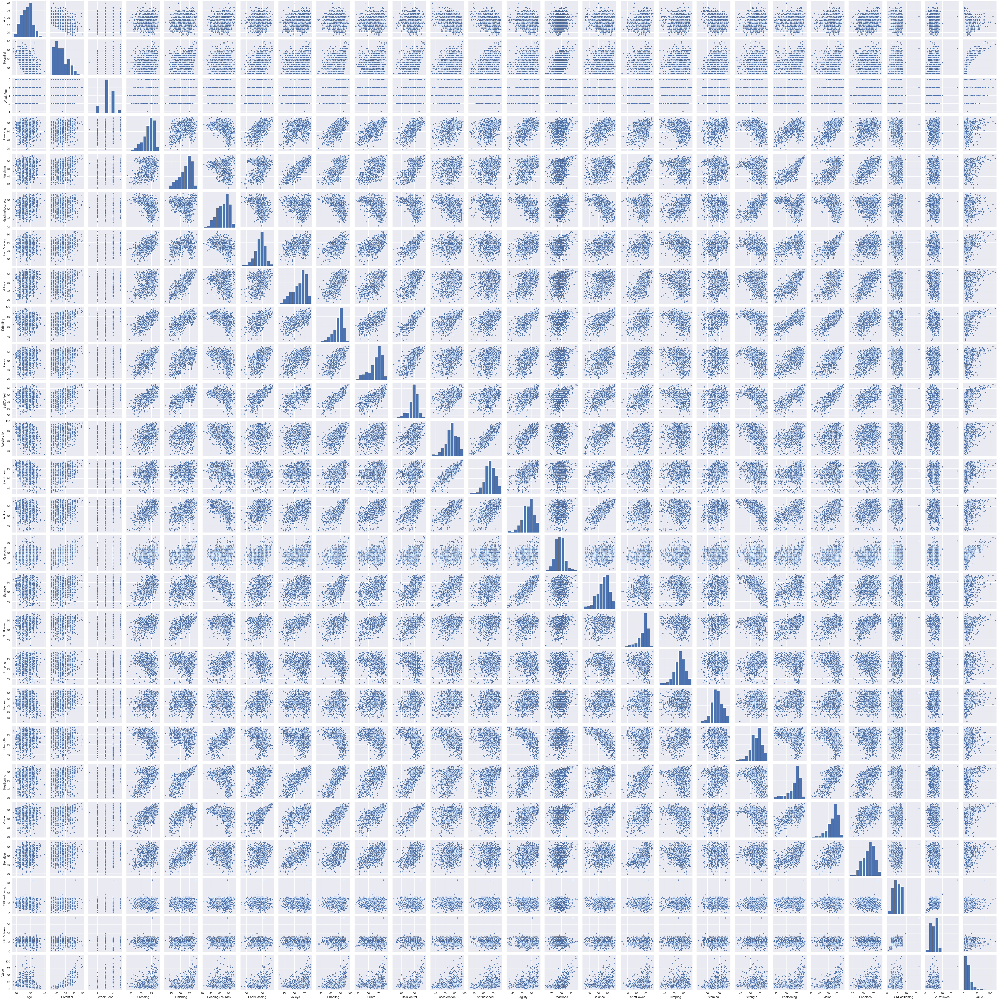

In [17]:
sns.pairplot(df)

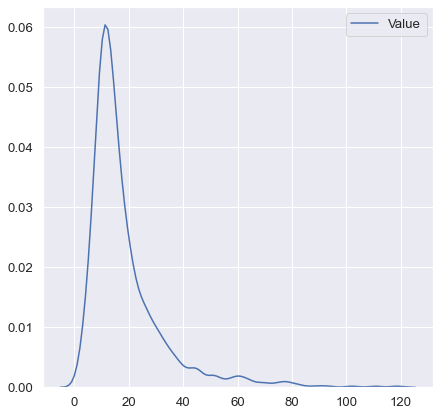

In [18]:
sns.kdeplot(df['Value'])

In [19]:
df['Value'].value_counts()

12.0     45
10.0     44
12.5     39
10.5     33
9.0      33
         ..
1.7       1
2.1       1
118.5     1
62.5      1
110.5     1
Name: Value, Length: 128, dtype: int64

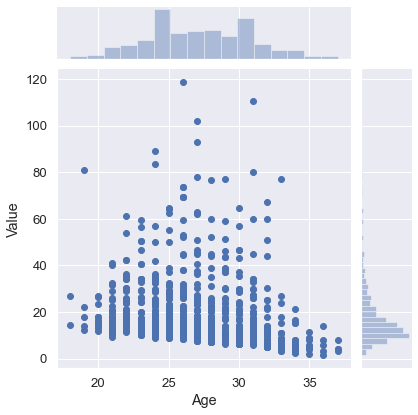

In [20]:
sns.jointplot(df['Age'],df['Value'])

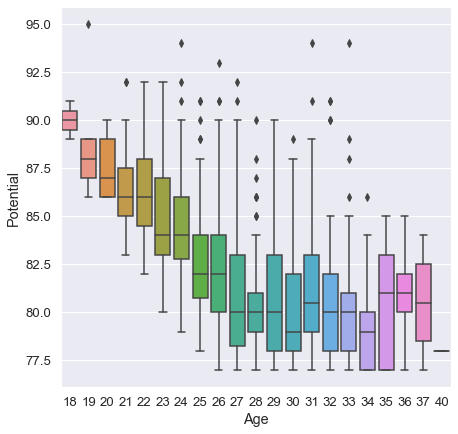

In [21]:
sns.boxplot(df['Age'],df['Potential'])

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 31 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              957 non-null    int64  
 1   Potential        957 non-null    int64  
 2   Wage             957 non-null    object 
 3   Preferred Foot   957 non-null    object 
 4   Weak Foot        957 non-null    int64  
 5   Position         957 non-null    object 
 6   Height           957 non-null    object 
 7   Weight           957 non-null    object 
 8   Crossing         957 non-null    int64  
 9   Finishing        957 non-null    int64  
 10  HeadingAccuracy  957 non-null    int64  
 11  ShortPassing     957 non-null    int64  
 12  Volleys          957 non-null    int64  
 13  Dribbling        957 non-null    int64  
 14  Curve            957 non-null    int64  
 15  BallControl      957 non-null    int64  
 16  Acceleration     957 non-null    int64  
 17  SprintSpeed    

In [23]:
df.drop('Wage',axis=1,inplace=True)
df.drop('Height',axis=1,inplace=True)
df.drop('Crossing',axis=1,inplace=True)
df.drop('Volleys',axis=1,inplace=True)
df.drop('Positioning',axis=1,inplace=True)
df.drop('Vision',axis=1,inplace=True)
df.drop('Penalties',axis=1,inplace=True)
df.drop('GKPositioning',axis=1,inplace=True)
df.drop('GKReflexes',axis=1,inplace=True)

In [24]:
df.head()

,Age,Potential,Preferred Foot,Weak Foot,Position,Weight,Finishing,HeadingAccuracy,ShortPassing,Dribbling,...,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,Value
0,31,94,Left,4,RF,159lbs,95,70,90,97,...,91,86,91,95,95,85,68,72,59,110.5
1,33,94,Right,4,ST,183lbs,94,89,81,88,...,89,91,87,96,70,95,95,88,79,77.0
2,26,93,Right,5,LW,150lbs,87,62,84,96,...,94,90,96,94,84,80,61,81,49,118.5
4,27,92,Right,5,RCM,154lbs,82,55,92,86,...,78,76,79,91,77,91,63,90,75,102.0
5,27,91,Right,4,LF,163lbs,84,61,89,95,...,94,88,95,90,94,82,56,83,66,93.0


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              957 non-null    int64  
 1   Potential        957 non-null    int64  
 2   Preferred Foot   957 non-null    object 
 3   Weak Foot        957 non-null    int64  
 4   Position         957 non-null    object 
 5   Weight           957 non-null    object 
 6   Finishing        957 non-null    int64  
 7   HeadingAccuracy  957 non-null    int64  
 8   ShortPassing     957 non-null    int64  
 9   Dribbling        957 non-null    int64  
 10  Curve            957 non-null    int64  
 11  BallControl      957 non-null    int64  
 12  Acceleration     957 non-null    int64  
 13  SprintSpeed      957 non-null    int64  
 14  Agility          957 non-null    int64  
 15  Reactions        957 non-null    int64  
 16  Balance          957 non-null    int64  
 17  ShotPower      

In [26]:
df['Weight']=df['Weight'].apply(lambda x: x[0:3])

In [27]:
df.head()

,Age,Potential,Preferred Foot,Weak Foot,Position,Weight,Finishing,HeadingAccuracy,ShortPassing,Dribbling,...,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,Value
0,31,94,Left,4,RF,159,95,70,90,97,...,91,86,91,95,95,85,68,72,59,110.5
1,33,94,Right,4,ST,183,94,89,81,88,...,89,91,87,96,70,95,95,88,79,77.0
2,26,93,Right,5,LW,150,87,62,84,96,...,94,90,96,94,84,80,61,81,49,118.5
4,27,92,Right,5,RCM,154,82,55,92,86,...,78,76,79,91,77,91,63,90,75,102.0
5,27,91,Right,4,LF,163,84,61,89,95,...,94,88,95,90,94,82,56,83,66,93.0


In [28]:
df['Weight'].value_counts()

165    64
176    63
154    61
172    56
159    56
170    52
168    49
163    48
161    47
187    39
174    38
181    34
183    34
179    32
152    29
157    29
150    28
148    26
185    22
190    18
146    17
143    13
196    12
194    11
139    10
141    10
192     9
201     8
198     7
137     7
203     5
134     5
132     4
207     3
214     2
205     2
216     2
130     2
209     1
212     1
220     1
Name: Weight, dtype: int64

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              957 non-null    int64  
 1   Potential        957 non-null    int64  
 2   Preferred Foot   957 non-null    object 
 3   Weak Foot        957 non-null    int64  
 4   Position         957 non-null    object 
 5   Weight           957 non-null    object 
 6   Finishing        957 non-null    int64  
 7   HeadingAccuracy  957 non-null    int64  
 8   ShortPassing     957 non-null    int64  
 9   Dribbling        957 non-null    int64  
 10  Curve            957 non-null    int64  
 11  BallControl      957 non-null    int64  
 12  Acceleration     957 non-null    int64  
 13  SprintSpeed      957 non-null    int64  
 14  Agility          957 non-null    int64  
 15  Reactions        957 non-null    int64  
 16  Balance          957 non-null    int64  
 17  ShotPower      

In [30]:
df['Weight']=pd.to_numeric(df['Weight'],errors='coerce')

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              957 non-null    int64  
 1   Potential        957 non-null    int64  
 2   Preferred Foot   957 non-null    object 
 3   Weak Foot        957 non-null    int64  
 4   Position         957 non-null    object 
 5   Weight           957 non-null    int64  
 6   Finishing        957 non-null    int64  
 7   HeadingAccuracy  957 non-null    int64  
 8   ShortPassing     957 non-null    int64  
 9   Dribbling        957 non-null    int64  
 10  Curve            957 non-null    int64  
 11  BallControl      957 non-null    int64  
 12  Acceleration     957 non-null    int64  
 13  SprintSpeed      957 non-null    int64  
 14  Agility          957 non-null    int64  
 15  Reactions        957 non-null    int64  
 16  Balance          957 non-null    int64  
 17  ShotPower      

In [32]:
df.drop('Position',axis=1,inplace=True)

In [33]:
PreferredFoot= {'Left':0, 
        'Right':1}
df['Preferred Foot'] = df['Preferred Foot'].map(PreferredFoot)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              957 non-null    int64  
 1   Potential        957 non-null    int64  
 2   Preferred Foot   957 non-null    int64  
 3   Weak Foot        957 non-null    int64  
 4   Weight           957 non-null    int64  
 5   Finishing        957 non-null    int64  
 6   HeadingAccuracy  957 non-null    int64  
 7   ShortPassing     957 non-null    int64  
 8   Dribbling        957 non-null    int64  
 9   Curve            957 non-null    int64  
 10  BallControl      957 non-null    int64  
 11  Acceleration     957 non-null    int64  
 12  SprintSpeed      957 non-null    int64  
 13  Agility          957 non-null    int64  
 14  Reactions        957 non-null    int64  
 15  Balance          957 non-null    int64  
 16  ShotPower        957 non-null    int64  
 17  Jumping        

In [35]:
df.head()

,Age,Potential,Preferred Foot,Weak Foot,Weight,Finishing,HeadingAccuracy,ShortPassing,Dribbling,Curve,...,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,Value
0,31,94,0,4,159,95,70,90,97,93,...,91,86,91,95,95,85,68,72,59,110.5
1,33,94,1,4,183,94,89,81,88,81,...,89,91,87,96,70,95,95,88,79,77.0
2,26,93,1,5,150,87,62,84,96,88,...,94,90,96,94,84,80,61,81,49,118.5
4,27,92,1,5,154,82,55,92,86,85,...,78,76,79,91,77,91,63,90,75,102.0
5,27,91,1,4,163,84,61,89,95,83,...,94,88,95,90,94,82,56,83,66,93.0


In [36]:
df.describe()

,Age,Potential,Preferred Foot,Weak Foot,Weight,Finishing,HeadingAccuracy,ShortPassing,Dribbling,Curve,...,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,Value
count,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,...,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,957.000000,949.000000
mean,27.159875,82.270637,0.762800,3.323929,168.089864,63.466040,67.037618,77.081505,74.840125,67.354232,...,72.384535,72.460815,72.333333,78.107628,69.919540,74.256008,70.554859,76.038662,71.474399,18.661749
std,3.715080,3.772687,0.425588,0.730093,15.243775,16.909931,13.043885,6.007635,10.356942,15.026508,...,12.225586,11.529105,12.276993,4.549807,13.119375,10.195694,11.718560,8.978564,11.477129,14.378345
min,18.000000,77.000000,0.000000,1.000000,130.000000,10.000000,23.000000,54.000000,33.000000,20.000000,...,32.000000,31.000000,29.000000,64.000000,28.000000,28.000000,30.000000,44.000000,30.000000,1.700000
25%,24.000000,79.000000,1.000000,3.000000,157.000000,53.000000,58.000000,74.000000,69.000000,60.000000,...,66.000000,66.000000,65.000000,75.000000,62.000000,70.000000,64.000000,70.000000,65.000000,10.000000
50%,27.000000,82.000000,1.000000,3.000000,168.000000,68.000000,69.000000,78.000000,77.000000,71.000000,...,74.000000,74.000000,74.000000,78.000000,72.000000,77.000000,72.000000,76.000000,73.000000,14.000000
75%,30.000000,85.000000,1.000000,4.000000,179.000000,77.000000,77.000000,81.000000,82.000000,79.000000,...,80.000000,79.000000,80.000000,81.000000,79.000000,81.000000,78.000000,83.000000,79.000000,21.500000
max,40.000000,95.000000,1.000000,5.000000,220.000000,95.000000,94.000000,93.000000,97.000000,94.000000,...,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,96.000000,94.000000,118.500000


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 957 entries, 0 to 1071
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              957 non-null    int64  
 1   Potential        957 non-null    int64  
 2   Preferred Foot   957 non-null    int64  
 3   Weak Foot        957 non-null    int64  
 4   Weight           957 non-null    int64  
 5   Finishing        957 non-null    int64  
 6   HeadingAccuracy  957 non-null    int64  
 7   ShortPassing     957 non-null    int64  
 8   Dribbling        957 non-null    int64  
 9   Curve            957 non-null    int64  
 10  BallControl      957 non-null    int64  
 11  Acceleration     957 non-null    int64  
 12  SprintSpeed      957 non-null    int64  
 13  Agility          957 non-null    int64  
 14  Reactions        957 non-null    int64  
 15  Balance          957 non-null    int64  
 16  ShotPower        957 non-null    int64  
 17  Jumping        

In [38]:
df.dropna(inplace=True)

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 949 entries, 0 to 1071
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              949 non-null    int64  
 1   Potential        949 non-null    int64  
 2   Preferred Foot   949 non-null    int64  
 3   Weak Foot        949 non-null    int64  
 4   Weight           949 non-null    int64  
 5   Finishing        949 non-null    int64  
 6   HeadingAccuracy  949 non-null    int64  
 7   ShortPassing     949 non-null    int64  
 8   Dribbling        949 non-null    int64  
 9   Curve            949 non-null    int64  
 10  BallControl      949 non-null    int64  
 11  Acceleration     949 non-null    int64  
 12  SprintSpeed      949 non-null    int64  
 13  Agility          949 non-null    int64  
 14  Reactions        949 non-null    int64  
 15  Balance          949 non-null    int64  
 16  ShotPower        949 non-null    int64  
 17  Jumping        

In [40]:
Q1 = df.quantile(0.25)
Q1

Age                 24.0
Potential           79.0
Preferred Foot       1.0
Weak Foot            3.0
Weight             157.0
Finishing           53.0
HeadingAccuracy     58.0
ShortPassing        74.0
Dribbling           69.0
Curve               60.0
BallControl         75.0
Acceleration        66.0
SprintSpeed         66.0
Agility             66.0
Reactions           75.0
Balance             62.0
ShotPower           70.0
Jumping             65.0
Stamina             70.0
Strength            65.0
Value               10.0
Name: 0.25, dtype: float64

In [41]:
Q3 = df.quantile(0.75)

In [42]:
IQR = Q3 - Q1
IQR

Age                 6.0
Potential           6.0
Preferred Foot      0.0
Weak Foot           1.0
Weight             22.0
Finishing          24.0
HeadingAccuracy    19.0
ShortPassing        7.0
Dribbling          13.0
Curve              19.0
BallControl         8.0
Acceleration       14.0
SprintSpeed        13.0
Agility            14.0
Reactions           6.0
Balance            17.0
ShotPower          11.0
Jumping            13.0
Stamina            13.0
Strength           14.0
Value              11.5
dtype: float64

In [43]:
df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]
df

,Age,Potential,Preferred Foot,Weak Foot,Weight,Finishing,HeadingAccuracy,ShortPassing,Dribbling,Curve,...,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,Value
39,33,88,1,3,181,38,81,80,62,61,...,70,72,68,82,68,71,90,74,82,24.0
69,28,86,1,3,168,46,76,81,69,68,...,76,76,72,88,73,68,76,87,71,35.0
70,31,86,1,3,187,48,86,77,69,56,...,57,65,60,84,52,74,85,71,83,30.0
73,31,86,1,3,207,47,83,65,64,34,...,65,75,59,82,53,66,85,69,91,30.0
75,33,86,1,4,148,69,63,85,77,70,...,68,67,72,86,78,83,76,79,76,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1062,25,82,1,3,179,80,77,65,68,67,...,70,68,62,74,75,82,82,69,88,12.0
1063,23,82,1,3,165,75,73,74,76,54,...,76,79,72,76,64,79,73,65,76,12.0
1064,24,83,1,4,190,65,78,77,74,72,...,72,74,62,72,62,79,70,87,83,10.5
1068,30,77,1,5,168,67,63,76,75,68,...,76,76,72,74,78,80,75,76,66,6.5


In [44]:
x = df.drop('Value', axis=1)
y = df['Value']
x

,Age,Potential,Preferred Foot,Weak Foot,Weight,Finishing,HeadingAccuracy,ShortPassing,Dribbling,Curve,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength
39,33,88,1,3,181,38,81,80,62,61,80,70,72,68,82,68,71,90,74,82
69,28,86,1,3,168,46,76,81,69,68,77,76,76,72,88,73,68,76,87,71
70,31,86,1,3,187,48,86,77,69,56,75,57,65,60,84,52,74,85,71,83
73,31,86,1,3,207,47,83,65,64,34,64,65,75,59,82,53,66,85,69,91
75,33,86,1,4,148,69,63,85,77,70,82,68,67,72,86,78,83,76,79,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1062,25,82,1,3,179,80,77,65,68,67,76,70,68,62,74,75,82,82,69,88
1063,23,82,1,3,165,75,73,74,76,54,74,76,79,72,76,64,79,73,65,76
1064,24,83,1,4,190,65,78,77,74,72,77,72,74,62,72,62,79,70,87,83
1068,30,77,1,5,168,67,63,76,75,68,76,76,76,72,74,78,80,75,76,66


In [45]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [46]:
poly = PolynomialFeatures(degree=5)

In [47]:
x_train_poly = poly.fit_transform(x_train)
x_test_poly = poly.fit_transform(x_test)

In [48]:
model = LinearRegression()
model.fit(x_train_poly, y_train)

LinearRegression()

In [49]:
y_pred = model.predict(x_test_poly)

In [50]:
model.score(x_test_poly, y_test)

0.404600650585236

In [51]:
model = LinearRegression()
model.fit(x_train, y_train)

LinearRegression()

In [52]:
y_pred = model.predict(x_test)

In [53]:
model.score(x_train, y_train)

0.7107727621605653

In [54]:
model.score(x_test, y_test)

0.7064275758958107

In [55]:
from sklearn.metrics import mean_squared_error

In [56]:
np.sqrt(mean_squared_error(y_test, y_pred))

4.184234086920524

In [57]:
y_pred[1]

14.54598464073834

In [58]:
y_test.iloc[1]

11.5

In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 533 entries, 39 to 1070
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              533 non-null    int64  
 1   Potential        533 non-null    int64  
 2   Preferred Foot   533 non-null    int64  
 3   Weak Foot        533 non-null    int64  
 4   Weight           533 non-null    int64  
 5   Finishing        533 non-null    int64  
 6   HeadingAccuracy  533 non-null    int64  
 7   ShortPassing     533 non-null    int64  
 8   Dribbling        533 non-null    int64  
 9   Curve            533 non-null    int64  
 10  BallControl      533 non-null    int64  
 11  Acceleration     533 non-null    int64  
 12  SprintSpeed      533 non-null    int64  
 13  Agility          533 non-null    int64  
 14  Reactions        533 non-null    int64  
 15  Balance          533 non-null    int64  
 16  ShotPower        533 non-null    int64  
 17  Jumping       

In [60]:
int(round(model.predict([[22, 95, 1,20,190,90,90,90,90,80,90,95,85,95,95,90,95,70,95,90]])[0]))

62

In [689]:
import joblib

In [690]:
joblib.dump(model, 'model.pkl')

['model.pkl']